In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import sys
if 'init_modules' in globals():
    for m in [x for x in sys.modules.keys() if x not in init_modules]:
        del(sys.modules[m]) 
else:
    init_modules = sys.modules.keys()

from math import *
import numpy as np
from matplotlib import pyplot as plt
from scipy.stats import ortho_group
from scipy.interpolate import griddata
np.set_printoptions(precision=7)

In [2]:
from chemistry import *
from chemistry.functions import GaussianWrapper
from chemistry.optimization import GradientDescent, delta_strategies, stop_strategies

In [3]:
charges = [1, 1, 8]
eq = np.array([0.00000000000, -1.09968100000, 0.45789805000,
               -0.00000000000, -0.27205852000, 1.79203420000,
               0.00000000000, -1.20765850000, 1.44866350000])

molecule = functions.Molecule([1, 1, 8], 3, 750)
optimizer = GradientDescent(delta_strategies.FollowGradient(), stop_strategies.GradNorm(1e-4))
path = optimizer(molecule, eq)

In [4]:
eq = path[-1]
molecule.grad(eq)

array([-3.2513181e-16,  5.8036650e-06, -9.3769911e-06,  1.2111180e-15,
       -1.0918422e-05,  1.0633588e-06, -8.8598621e-16,  5.1147569e-06,
        8.3136324e-06])

In [5]:
molecule = functions.Molecule([1, 1, 8], 3, 750)
normalized = utils.linalg.get_normal_coordinate(molecule, eq)

/home/george/work/np-complete/study/au/python_chemistry/chemistry/utils/linalg.py:51: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  new_dir = new_dir - basis[:, :i].dot(np.linalg.lstsq(basis[:, :i], new_dir)[0])


In [6]:
def sample_on_sphere(func, max_r, n_r, n_phi):
    vects = []
    values = []
    for axis_num in range(3):
        for r in np.linspace(0, max_r, n_r)[1:]:
            for phi in np.linspace(0, 2 * pi, n_phi):
                for sign in [-1, 1]:
                    x = r * cos(phi)
                    y = r * sin(phi)
                    z = sign * np.sqrt(abs(max_r**2 - x**2 - y**2))

                    vect = np.array([x, y, z])
                    vect = np.roll(vect, axis_num)
                    vects.append(vect)
                    values.append(normalized(vect))
        
    return vects, values

def plot_in_polar(phis, rs, vs, ax, n_grid=100, is_contour=False):
    max_r = np.max(rs)

    grid_phi = np.linspace(0.0, 2 * pi, n_grid)
    grid_r = np.linspace(0, 2 * pi, n_grid)
    grid_phi, grid_r = np.meshgrid(grid_phi, grid_r)

    data = griddata((phis, rs / np.max(rs) * 2 * pi), vs, (grid_phi, grid_r), method='cubic')
    grid_r = .5 * max_r * grid_r / pi

    if is_contour:
        ax.contour(grid_phi, grid_r, data, 200)
    else:
        ax.pcolormesh(grid_phi, grid_r, data)
    
def global_to_polar(vects, axis_num, orient, r_eps=1e-7):
    phis = []
    rs = []
    inds = []
    
    for i, vect in enumerate(vects):
        if orient * vect[axis_num] < 0:
            continue

        vect = np.array([vect[(axis_num + 1) % 3], vect[(axis_num + 2) % 3]])

        if abs(np.linalg.norm(vect)) < r_eps:
            continue

        phis.append(atan2(vect[1], vect[0]))
        if phis[-1] < 0:
            phis[-1] += 2 * pi
        rs.append(np.linalg.norm(vect))
        inds.append(i)
        
    return phis, rs, inds

    
def plot_all_spheres(vects, values, r_eps=1e-7, title=None, n_grid=100, is_contour=False, **fig_kw):
    fig, axs = plt.subplots(3, 2, subplot_kw={'projection': 'polar'}, **fig_kw)
    plt.suptitle(title)
    
    for axis_num in range(3):
        for orient_num, orient in enumerate([1, -1]):
            phis, rs, inds = global_to_polar(vects, axis_num, orient, r_eps)
            vs = [values[i] for i in inds]

            value = vs[np.argmin(rs)]
            for phi in set(phis):
                phis.append(phi)
                rs.append(0)
                vs.append(value)

            phis = np.array(phis)
            vs = np.array(vs)
            rs = np.array(rs)
            axs[axis_num][orient_num].set_title('{}'.format(orient * utils.linalg.eye(3, axis_num)))
            plot_in_polar(phis, rs, vs, axs[axis_num][orient_num], n_grid, is_contour)
            
    return axs

def plot_path(axs, path, c='r'):
    for axis_num, ax_row in enumerate(axs):
        for orient_num, ax in enumerate(ax_row):
            phis, rs, inds = global_to_polar(path, axis_num, 1 - orient_num * 2)
            if len(phis):
                ax.plot(phis, rs, c=c)
                ax.scatter(phis, rs)                
                if inds[-1] == len(path) - 1:
                    ax.scatter(phis[-1:], rs[-1:])

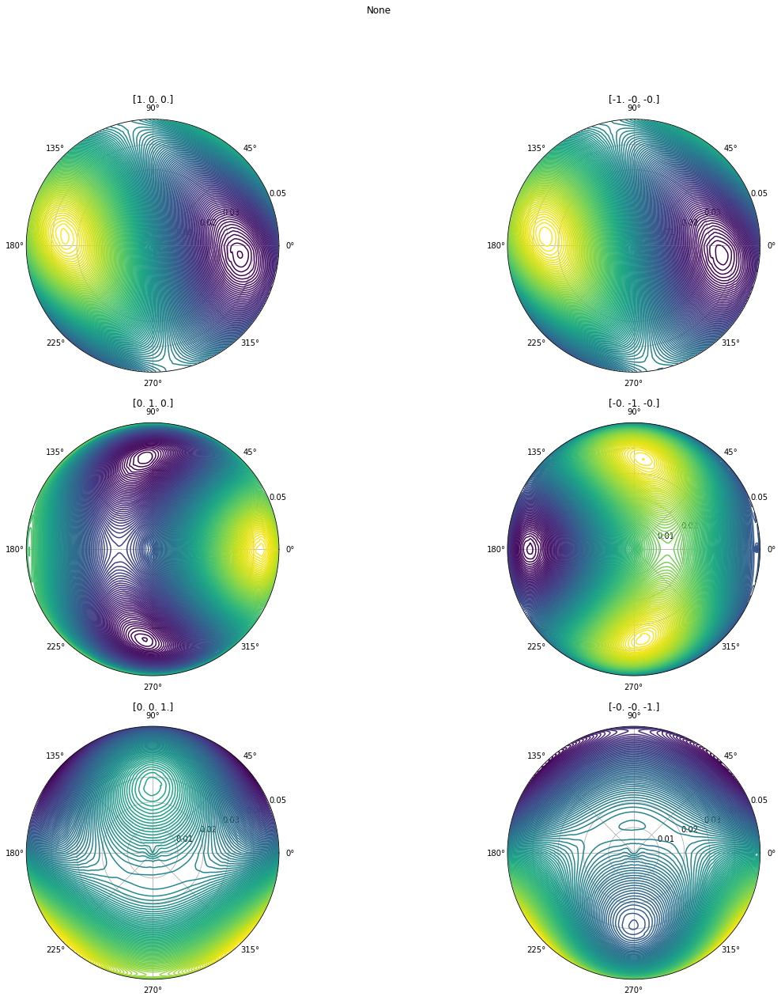

In [ ]:
MAX_R = .05
N_PHI = 20
N_R = 20
vects, values = sample_on_sphere(molecule, MAX_R, N_R, N_PHI)
axs = plot_all_spheres(vects, values, figsize=(20, 20), n_grid=250, is_contour=True)



new iteration
value = -75.9725973839739, grad norm = [ 0.0345857 -0.0345857  0.0103757], delta norm = 6.573535028667311e-05
delta norm = 9.280600414576462
expected = -0.02381140562008518, real = -0.00014044752485631307, d = 0.9941016701366909

delta norm = 4.640300207288231
expected = -0.006089495099639072, real = -2.0433435295785785e-05, d = 0.9966444779145981

delta norm = 2.3201501036441154
expected = -0.0015906956222186564, real = -0.0001299919730968213, d = 0.9182797945244155

delta norm = 1.1600750518220577
expected = -0.0004318348292091083, real = -0.00013230457234669757, d = 0.6936222754681248

delta norm = 0.5800375259110289
expected = -0.0001250391691294992, real = -9.014604296453399e-05, d = 0.27905756578426616



new iteration
value = -75.97268753001708, grad norm = [ 0.037741  -0.0138133  0.0297458], delta norm = 0.0001767504274666139
delta norm = 2.708359071358302
expected = -0.001006089283804769, real = -1.1642871584172099e-05, d = 0.9884275960676753

delta norm = 1.35

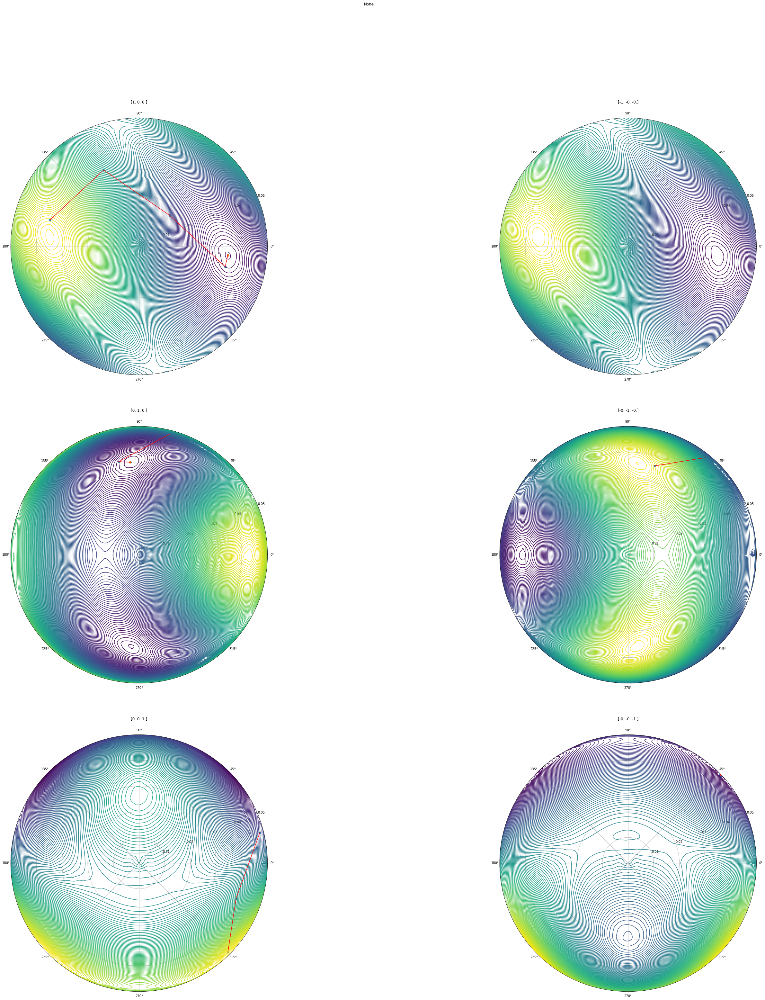

In [10]:
dir = np.array([1, -1, .3])
# dir = np.random.randn(normalized.n_dims)
dir = dir / np.linalg.norm(dir) * MAX_R
path = optimization.optimization.optimize_on_sphere2(normalized, MAX_R, dir, 
                                     stop_strategies.GradNorm(1e-7))

axs = plot_all_spheres(vects, values, figsize=(50, 50), n_grid=1000, is_contour=True)
plot_path(axs, path)
plt.show()